<a href="https://colab.research.google.com/github/LeoTU911/SCC413/blob/main/CycleGAN_3_0_epoch150.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install dominate
!pip install visdom

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 KB 7.7 MB/s eta 0:00:00
  Created wheel for visdom: filename=visdom-0.2.4-py3-none-any.whl size=1408217 sha256=537134b3893cefcb7cc20feba6b2d89b65ffa741674112d970016321bb0a2ee5
  Stored in directory: /root/.cache/pip/wheels/fb/b1/fc/b05c2c1930a412f01bd07dacaeb5fd8cc4bcccf71c835b0281
Successfully built visdom


In [ ]:
import dominate
import visdom
import os

In [ ]:
!git clone https://github.com/LeoTU911/SCC413/

Cloning into 'SCC413'...
remote: Enumerating objects: 805, done.
remote: Counting objects: 100% (73/73), done.
remote: Compressing objects: 100% (70/70), done.
remote: Total 805 (delta 26), reused 11 (delta 3), pack-reused 732
Receiving objects: 100% (805/805), 207.91 MiB | 14.23 MiB/s, done.
Resolving deltas: 100% (128/128), done.
Updating files: 100% (801/801), done.


In [ ]:
#!rm -r /content/SCC413/*

In [ ]:
cd /content/SCC413/CycleGAN

/content/SCC413/CycleGAN


In [29]:
!python train.py\
  --dataroot ./datasets/CUHK/\
  --name      s2p_cyclegan\
  --model     cycle_gan\
  --batch_size   8\
  --netD      n_layers\
  --n_layers_D   5\
  --n_epochs    100\
  --n_epochs_decay 50\
  --norm      batch\
  --netG      unet_256

----------------- Options ---------------
               batch_size: 8                             	[default: 1]
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: False                         
                crop_size: 256                           
                 dataroot: ./datasets/CUHK/              	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
              display_env: main                          
             display_freq: 400                           
               display_id: 1                             
            display_ncols: 4                             
             display_port: 8097                          
           display_server: http://localhost              
          display_winsize: 256                           
                    epoch: latest                        
 

In [30]:
!python test.py --dataroot ./datasets/CUHK/ --name s2p_cyclegan --model cycle_gan --netD n_layers --n_layers_D 5 --norm batch --netG unet_256

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: ./datasets/CUHK/              	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                  gpu_ids: 0                             
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0                            

In [ ]:
import difflib
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error
import skimage
import cv2

def getCorrespondingRealImage(fileName, img_List):
  keywords = fileName.split('_')
  label_tmp = keywords[2].split('.')
  label = 'real_' + label_tmp[0]

  relatedImages = difflib.get_close_matches(keywords[0], img_List, 6, 0.3)
  realImage = difflib.get_close_matches(label, relatedImages, 1, 0.3)

  return realImage[0]

def imgPredictionEvaluate(realImg, predictImg):
  realImg = skimage.io.imread(realImg)
  predictImg = skimage.io.imread(predictImg)
  realImg_gray = cv2.cvtColor(realImg, cv2.COLOR_BGR2GRAY)
  predictImg_gray = cv2.cvtColor(predictImg, cv2.COLOR_BGR2GRAY)

  img_array_real  = img_as_float(realImg_gray)
  img_array_predict = img_as_float(predictImg_gray)

  mse_2img = mean_squared_error(img_array_real, img_array_predict)
  ssim_2img = ssim(img_array_real, img_array_predict,
                    data_range=img_array_predict.max() - img_array_predict.min())

  evaluations = [round(mse_2img, 4), round(ssim_2img, 4)]
  return evaluations


In [31]:
result_Path = './results/s2p_cyclegan/test_latest/images'
img_List = list(sorted(os.listdir(result_Path)))
img_Results = []

for fileName in img_List:
  img_tmp = os.path.join(result_Path, fileName)

  img_real_name = getCorrespondingRealImage(fileName, img_List)
  img_real = os.path.join(result_Path, img_real_name)
  evaluation_tmp = imgPredictionEvaluate(img_real, img_tmp)

  img_Results.append([img_tmp, evaluation_tmp])

True

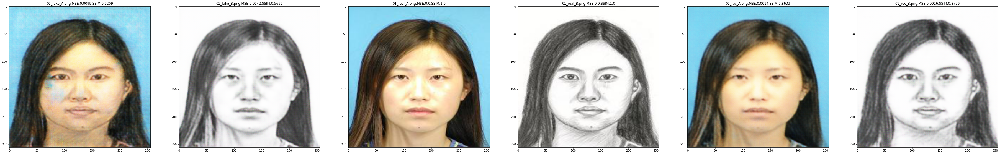

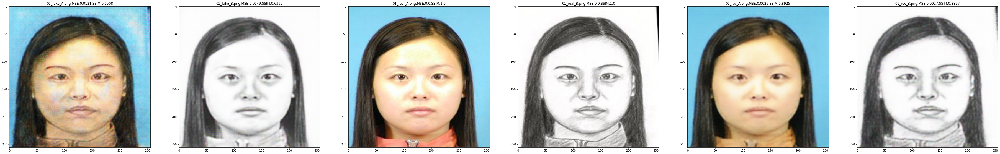

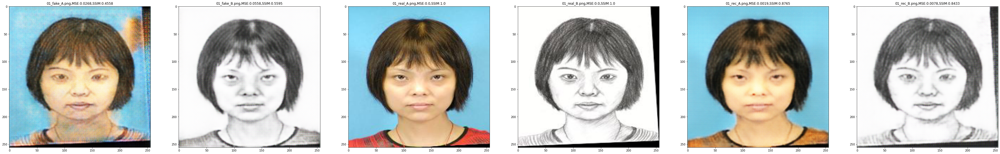

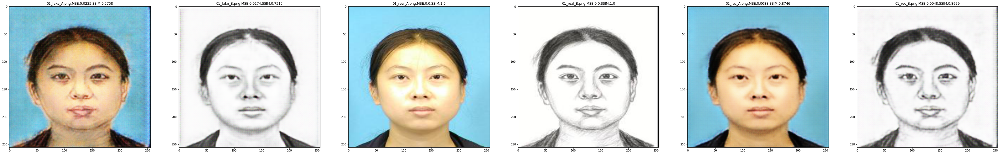

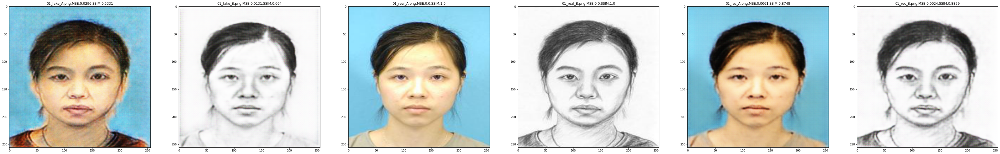

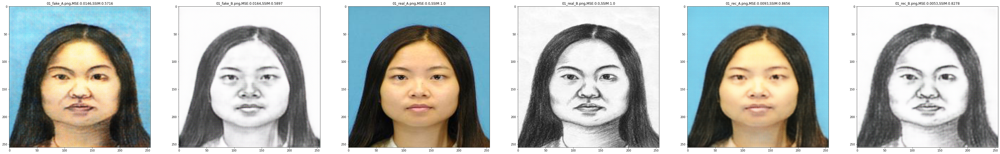

In [32]:
import matplotlib.pyplot as plt

def plotPredictImages(n_images):

  for i in range(n_images):
    image_index = i*6
    plt.figure(figsize = (64, 64))
    for j in range(image_index, image_index+6):
      plt.subplot(1,6,j%6+1)
      img = plt.imread(img_Results[j][0])
      name_tmp = img_List[j].split('-')
      name = name_tmp[2]
      mse = img_Results[j][1][0]
      ssim = img_Results[j][1][1]

      title = '{},MSE:{},SSIM:{}'.format(name, mse, ssim) 
      plt.title(title)
      plt.imshow(img)
        
  return True

plotPredictImages(6)

In [33]:
import numpy as np

MSE_FakePhoto_all = []
MSE_FakeSketch_all = []
MSE_RecPhoto_all = []
MSE_RecSketch_all = []

SSIM_FakePhoto_all = []
SSIM_FakeSketch_all = []
SSIM_RecPhoto_all = []
SSIM_RecSketch_all = []

for i in range(len(img_Results)):
  # fake photo is positioned at 1st of each group of images(6 images as 1 group)
  # 1st fake photo
  # 2nd fake sketch
  # 3rd real image
  # 4th real sketch
  # 5th rec image
  # 6th rec sketch
  if (i+1)%6 == 1:
    MSE_fake_tmp = img_Results[i][1][0]
    SSIM_fake_tmp = img_Results[i][1][1]
    MSE_FakePhoto_all.append(MSE_fake_tmp)
    SSIM_FakePhoto_all.append(SSIM_fake_tmp)
  # fake sketch
  if (i+1)%6 == 2:
    MSE_fake_tmp = img_Results[i][1][0]
    SSIM_fake_tmp = img_Results[i][1][1]
    MSE_FakeSketch_all.append(MSE_fake_tmp)
    SSIM_FakeSketch_all.append(SSIM_fake_tmp)
  # rec photo
  if (i+1)%6 == 5:
    MSE_fake_tmp = img_Results[i][1][0]
    SSIM_fake_tmp = img_Results[i][1][1]
    MSE_RecPhoto_all.append(MSE_fake_tmp)
    SSIM_RecPhoto_all.append(SSIM_fake_tmp)
  # rec sketch
  if (i+1)%6 == 0:
    MSE_fake_tmp = img_Results[i][1][0]
    SSIM_fake_tmp = img_Results[i][1][1]
    MSE_RecSketch_all.append(MSE_fake_tmp)
    SSIM_RecSketch_all.append(SSIM_fake_tmp)

# calculate the overall MSE & SSIM
def calculateMSE(MSE_list):
  MSE_all_Mean = round(np.mean(MSE_list), 4)
  MSE_all_Max = np.max(MSE_list)
  MSE_all_Min = np.min(MSE_list)
  results = [MSE_all_Mean, MSE_all_Max, MSE_all_Min]
  return results

def calculateSSIM(SSIM_List):
  SSIM_all_Mean = round(np.mean(SSIM_List), 4)
  SSIM_all_Max = np.max(SSIM_List)
  SSIM_all_Min = np.min(SSIM_List)
  results = [SSIM_all_Mean, SSIM_all_Max, SSIM_all_Min]
  return results


fp_MSE = calculateMSE(MSE_FakePhoto_all)
fp_SSIM = calculateSSIM(SSIM_FakePhoto_all)

fs_MSE = calculateMSE(MSE_FakeSketch_all)
fs_SSIM = calculateSSIM(SSIM_FakeSketch_all)

rp_MSE = calculateMSE(MSE_RecPhoto_all)
rp_SSIM = calculateSSIM(SSIM_RecPhoto_all)

rs_MSE = calculateMSE(MSE_RecSketch_all)
rs_SSIM = calculateSSIM(SSIM_RecSketch_all)

print('The overall MSE analysis of test dataset:\nFake Photo: Mean:{}, Max:{}, Min:{}'.format(fp_MSE[0], fp_MSE[1], fp_MSE[2]))
print('Fake Sketch: Mean:{}, Max:{}, Min:{}'.format(fs_MSE[0], fs_MSE[1], fs_MSE[2]))
print('Reconstruction Photo: Mean:{}, Max:{}, Min:{}'.format(rp_MSE[0], rp_MSE[1], rp_MSE[2]))
print('Reconstruction Sketch: Mean:{}, Max:{}, Min:{}\n'.format(rs_MSE[0], rs_MSE[1], rs_MSE[2]))
print('The overall SSIM analysis of test dataset:\nFake Photo: Mean:{}, Max:{}, Min:{}'.format(fp_SSIM[0], fp_SSIM[1], fp_SSIM[2]))
print('Fake Sketch: Mean:{}, Max:{}, Min:{}'.format(fs_SSIM[0], fs_SSIM[1], fs_SSIM[2]))
print('Reconstruction Photo: Mean:{}, Max:{}, Min:{}'.format(rp_SSIM[0], rp_SSIM[1], rp_SSIM[2]))
print('Reconstruction Sketch: Mean:{}, Max:{}, Min:{}'.format(rs_SSIM[0], rs_SSIM[1], rs_SSIM[2]))

The overall MSE analysis of test dataset:
Fake Photo: Mean:0.0277, Max:0.0713, Min:0.008
Fake Sketch: Mean:0.0348, Max:0.1051, Min:0.0111
Reconstruction Photo: Mean:0.0047, Max:0.0373, Min:0.0009
Reconstruction Sketch: Mean:0.0052, Max:0.019, Min:0.0014

The overall SSIM analysis of test dataset:
Fake Photo: Mean:0.511, Max:0.5797, Min:0.4279
Fake Sketch: Mean:0.5981, Max:0.7313, Min:0.4676
Reconstruction Photo: Mean:0.8764, Max:0.9217, Min:0.7394
Reconstruction Sketch: Mean:0.8561, Max:0.9017, Min:0.7427
